In [20]:
# modified from https://github.com/SherlockLiao/Deep-Dream/blob/master/show_image.ipynb
import torch
import torchvision.models as models
from torchvision import transforms
from PIL import Image
from deepDream import dream
import torch.nn as nn
import spectroUtils as sUtils
import IPython.display as ipd
import librosa
import librosa.display
import numpy as np
import math
from torch.autograd import Variable
from network import *

import matplotlib.pyplot as plt

# Experiments with amp and phase models separately

In [21]:
#Original hip-hopaudio
trackId = 2
minAmp = -80.0
maxAmp = 1.9073486e-06
audioDirectory = "data/fma_small/"
audioFilename = audioDirectory + "000/000002.mp3"
x, sr = librosa.load(audioFilename, sr=None, mono=True, duration = 10, offset = 0)
start, end = 0, 30
ipd.Audio(data=x[start*sr:end*sr], rate=sr)

scaledSpectro [[113 166 177 ... 207 198 195]
 [103 157 143 ... 172 149 171]
 [121 175 177 ... 180 181 173]
 ...
 [ 18  37  70 ...  56  60 124]
 [ 10  65  45 ...  63  65 124]
 [  0  66  59 ...  65  46 124]]
scaledPhase [[  0  65 210 ...   9  85 134]
 [128 217  64 ... 226  98  39]
 [128 136 129 ... 244 205  16]
 ...
 [128 193 190 ... 236 159 104]
 [255 158  89 ...  23  19  63]
 [128 145  73 ...  14 253  21]]


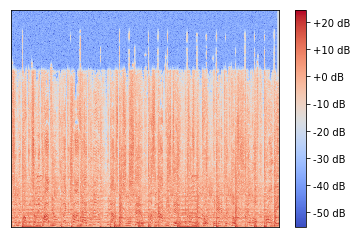

In [22]:
#scaledSpectro, phase, origSpectroSize = sUtils.loadSpectro(trackId, spectroSize, minAmp, maxAmp)
#scaledSpectro = scaledSpectro.data.numpy()
spectro = librosa.core.stft(x)
origMag, origPhase = librosa.core.magphase(spectro)
origSpectroSize = spectro.shape
spectroSize = (512, 512)
scaledSpectro = sUtils.scaleSpectro(librosa.power_to_db(np.abs(spectro)), spectroSize, minAmp, maxAmp)
scaledPhase = sUtils.scalePhase(np.angle(spectro), spectroSize, -math.pi, math.pi)

print("scaledSpectro", scaledSpectro)
print ("scaledPhase", scaledPhase)
#scaledSpectro = scaledSpectro.data.numpy()
#scaledPhase = scaledPhase.data.numpy()

plt.figure()
librosa.display.specshow(librosa.power_to_db(np.abs(spectro)))
plt.colorbar(format='%+2.0f dB')
plt.show()

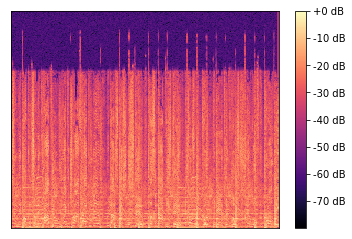

In [23]:
# Scaled version of audio
backToSpectro = librosa.power_to_db(sUtils.unscaleSpectro(scaledSpectro, origSpectroSize, minAmp, maxAmp))
plt.figure()
librosa.display.specshow(backToSpectro)
plt.colorbar(format='%+2.0f dB')
plt.show()

In [24]:
backToSpectro = librosa.core.db_to_power(backToSpectro)
backToPhase = sUtils.unscalePhase(scaledPhase, origSpectroSize, -math.pi, math.pi)
invStft = np.zeros(backToSpectro.shape, dtype=np.complex_)
for i in range(invStft.shape[0]):
    for j in range(invStft.shape[1]):
        invStft[i,j] = complex(backToSpectro[i,j]*math.cos(backToPhase[i,j]), backToSpectro[i,j]*math.sin(backToPhase[i,j]))
n = len(x)
y_hat = librosa.istft(invStft, length = n)
ipd.Audio(data=y_hat[start*sr:end*sr], rate=sr)

In [25]:
librosa.output.write_wav('scaledExample.wav', y_hat, sr)

In [26]:
scaledSpectro = np.expand_dims(np.expand_dims(scaledSpectro, 0),0).astype(np.float32)
scaledPhase = np.expand_dims(np.expand_dims(scaledPhase, 0),0).astype(np.float32)

In [27]:
modelMag = resnet18(channel=1, num_classes=4).cuda()
modelPhase = resnet18(channel=1, num_classes=4).cuda()

1
1


In [28]:
checkpoint = torch.load('new_model/checkpoints/checkpoints_magnitude/checkpoints/model_best.pth.tar')
modelMag.load_state_dict(checkpoint['state_dict'])
checkpoint = torch.load('new_model/checkpoints/checkpoints_phase/model_best.pth.tar')
modelPhase.load_state_dict(checkpoint['state_dict'])

modelMag = nn.Sequential(*list(modelMag.children())[:-3])
modelPhase = nn.Sequential(*list(modelPhase.children())[:-3])

In [29]:
print ("scaledSpectro.shape", scaledSpectro.shape)
dreamSpectro = dream(modelMag, scaledSpectro)
dreamSpectro = dreamSpectro[0,0,:]
print ("dreamSpectro")
print (dreamSpectro.shape)

scaledSpectro.shape (1, 1, 512, 512)
model after removing 7
(1, 1, 95, 95)


/home/iaakhter/.conda/envs/mypy35/lib/python3.5/site-packages/scipy/ndimage/interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


ratio 0.06374182
learning_rate_use 6.27531520293545
imgBefore [[[[113.063225  179.96129   188.21469   ... 189.61511   200.16133
    195.13332  ]
   [109.73695   184.45776   187.69356   ... 204.60439   204.17775
    196.28293  ]
   [102.892     182.00757   192.76929   ... 200.16399   207.0316
    205.56926  ]
   ...
   [ 25.07175    60.096607   56.81517   ...  59.183247   60.051018
    124.54435  ]
   [ 20.539038   58.764732   57.22577   ...  57.655148   59.619286
    124.66759  ]
   [ -0.5508007  59.480476   59.91485   ...  56.02367    57.373024
    124.346664 ]]]]
imgAfter (1, 1, 95, 95)
ratio 0.06188118
learning_rate_use 6.464000759010404
imgBefore [[[[112.72275   179.20323   187.80853   ... 189.83026   200.43239
    195.6646   ]
   [109.21079   184.53299   188.34012   ... 204.84799   205.011
    196.40431  ]
   [102.74698   182.9191    193.86902   ... 200.30832   206.74648
    204.17284  ]
   ...
   [ 24.848173   59.92779    56.960052  ...  58.85764    60.01287
    124.86103  ]
   [

imgAfter (1, 1, 95, 95)
ratio 0.05932469
learning_rate_use 6.7425553396107345
imgBefore [[[[114.09741  179.79506  188.95393  ... 190.24135  199.66737
    195.99835 ]
   [109.58516  182.86253  188.56715  ... 205.20119  205.92175
    198.83664 ]
   [101.06857  182.92857  194.59125  ... 199.88747  208.218
    204.32951 ]
   ...
   [ 26.654663  61.711887  56.913273 ...  61.33341   62.45681
    127.228386]
   [ 19.895586  57.089993  57.719852 ...  58.611225  59.20242
    125.75418 ]
   [  1.537756  59.8341    59.106075 ...  57.86785   57.022312
    124.70937 ]]]]
imgAfter (1, 1, 95, 95)
ratio 0.059021197
learning_rate_use 6.777226125078598
imgBefore [[[[114.59439   180.19281   189.1037    ... 190.37613   200.13503
    196.19289  ]
   [109.75814   182.86183   188.28596   ... 204.76266   205.35036
    199.3203   ]
   [100.915726  183.05415   194.81099   ... 199.55617   208.09587
    204.78308  ]
   ...
   [ 26.39089    61.425053   56.80327   ...  61.39981    62.51226
    127.44523  ]
   [ 20.

ratio 0.06531985
learning_rate_use 6.123712678859397
imgBefore [[[[114.49684   177.86241   186.49953   ... 212.31076   207.65015
    195.24567  ]
   [111.45705   187.34888   183.30035   ... 212.18219   193.88658
    177.05536  ]
   [ 99.98277   203.67882   200.06456   ... 214.49467   203.5855
    202.11632  ]
   ...
   [ 29.497257   60.59613    62.386395  ...  61.80668    60.353123
    130.21222  ]
   [ 17.68336    59.364983   62.67869   ...  60.351192   60.93586
    129.46451  ]
   [  2.8419669  62.60379    62.245274  ...  55.372597   66.43222
    127.03033  ]]]]
imgAfter (1, 1, 186, 186)
ratio 0.058702093
learning_rate_use 6.81406713393807
imgBefore [[[[113.486336 176.13994  186.60988  ... 213.54668  207.57648
    195.80975 ]
   [110.78114  186.85056  183.70195  ... 212.91937  193.63635
    177.20251 ]
   [ 99.18132  203.76144  200.09792  ... 214.2484   203.67485
    203.37848 ]
   ...
   [ 28.955053  60.547543  62.286938 ...  61.655197  60.980602
    130.62984 ]
   [ 17.275162  58.8

imgBefore [[[[111.66991   173.80338   180.98607   ... 211.11931   203.62679
    194.71764  ]
   [115.43458   176.84471   182.32224   ... 191.13522   180.73401
    163.88321  ]
   [106.38937   200.98952   186.48985   ... 210.8271    202.86035
    192.47147  ]
   ...
   [ 30.224592   59.71098    61.234596  ...  64.08021    60.982525
    131.8507   ]
   [  8.1179085  58.839203   56.791325  ...  60.853348   60.658035
    128.97661  ]
   [  3.5656464  63.375336   64.54462   ...  70.169556   59.11793
    124.14309  ]]]]
imgAfter (1, 1, 261, 261)
ratio 0.062809415
learning_rate_use 6.368471971451947
imgBefore [[[[111.34883   174.20462   181.02615   ... 211.098     203.92615
    195.10736  ]
   [115.30819   176.76723   182.13214   ... 190.6138    181.49323
    164.56537  ]
   [106.441925  201.49443   187.23389   ... 210.90756   203.79324
    193.16483  ]
   ...
   [ 29.156164   58.97856    61.60549   ...  64.169495   61.58454
    131.82478  ]
   [  7.6096315  58.80271    56.88066   ...  60.754

imgBefore [[[[111.88789   171.70894   176.1049    ... 208.9295    202.1041
    196.10332  ]
   [111.76689   161.75525   170.87653   ... 177.09036   168.90448
    174.05586  ]
   [124.17122   191.20384   192.83759   ... 201.63914   194.4796
    156.88103  ]
   ...
   [  4.9577036  55.734863   65.44116   ...  61.154484   63.656376
    130.67557  ]
   [ 14.595031   56.342453   65.5507    ...  60.01793    64.221146
    128.06729  ]
   [  5.494214   67.512054   58.530003  ...  70.93186    55.910675
    124.52892  ]]]]
imgAfter (1, 1, 366, 366)
ratio 0.060219638
learning_rate_use 6.6423514480529215
imgBefore [[[[111.626114  171.56245   176.18387   ... 209.24802   202.59767
    196.10266  ]
   [111.612045  161.84584   171.0542    ... 177.21977   168.86841
    174.06741  ]
   [123.92472   191.52245   192.97356   ... 201.63237   194.3341
    156.93813  ]
   ...
   [  4.798967   55.575657   65.29599   ...  61.253212   63.68864
    130.8701   ]
   [ 14.274968   55.88435    65.72693   ...  59.8623

(1, 1, 512, 512)
ratio 0.06301001
learning_rate_use 6.348197978966686
imgBefore [[[[108.067986  164.01701   178.3049    ... 207.14468   198.63766
    198.45184  ]
   [101.63576   156.07298   143.30788   ... 172.21259   149.53937
    172.78209  ]
   [121.0983    173.75432   177.2012    ... 181.62973   182.85208
    175.13504  ]
   ...
   [ 22.674469   40.23906    72.966156  ...  60.16388    65.69662
    132.30429  ]
   [ 14.480325   68.558876   48.177963  ...  66.60109    69.3816
    130.57346  ]
   [  4.0255356  69.0839     63.60791   ...  68.89393    49.798885
    126.609406 ]]]]
imgAfter (1, 1, 512, 512)
ratio 0.06628081
learning_rate_use 6.034929080963932
imgBefore [[[[108.058525 164.08514  179.09995  ... 207.1942   198.89867
    198.5961  ]
   [101.573944 157.41385  144.50493  ... 172.33505  149.93271
    172.87747 ]
   [121.05448  173.96625  178.04234  ... 181.5368   183.25958
    175.22723 ]
   ...
   [ 22.652742  40.79495   74.031906 ...  60.51143   65.818184
    132.50505 ]
   

ratio 0.06198258
learning_rate_use 6.453426156796341
imgBefore [[[[107.59768   163.6184    178.85097   ... 205.79526   198.10683
    199.50679  ]
   [100.46864   155.90486   143.34412   ... 174.8357    150.84537
    173.15727  ]
   [120.73227   171.52885   178.86278   ... 184.61612   186.98718
    177.92035  ]
   ...
   [ 24.141909   41.277912   72.84759   ...  58.589275   64.356476
    131.9162   ]
   [ 16.09805    69.65268    48.962948  ...  66.16988    70.58224
    133.89919  ]
   [  3.0308058  68.74356    64.95163   ...  69.36826    48.301964
    127.380486 ]]]]
imgAfter (1, 1, 512, 512)
ratio 0.06320817
learning_rate_use 6.328295828084516
imgBefore [[[[108.77745   164.83675   178.81721   ... 206.34344   199.09021
    199.8723   ]
   [101.54485   156.22542   142.91402   ... 176.22157   151.46523
    173.86975  ]
   [120.118805  171.69363   178.71689   ... 184.04968   186.50552
    177.8212   ]
   ...
   [ 24.696127   41.56107    72.23319   ...  57.784004   64.31462
    132.70987  ]

In [30]:
dreamPhase = dream(modelPhase, scaledPhase)
dreamPhase = dreamPhase[0,0,:]
print ("dreamPhase")
print (dreamPhase)

model after removing 7
(1, 1, 95, 95)
ratio 0.19341908
learning_rate_use 2.0680482598986836
imgBefore [[[[6.74987212e-03 1.12683517e+02 1.03113564e+02 ... 1.12302223e+02
    1.18928024e+02 1.33979935e+02]
   [1.16955986e+02 1.27181435e+02 1.07311142e+02 ... 1.34858475e+02
    1.35328949e+02 8.84773636e+01]
   [1.44549835e+02 1.37704941e+02 1.28531448e+02 ... 1.41456894e+02
    1.32309708e+02 1.62514267e+02]
   ...
   [7.12041245e+01 1.30747421e+02 1.04653183e+02 ... 1.13497894e+02
    1.42288651e+02 1.24694458e+02]
   [1.81891724e+02 1.34900742e+02 1.26229935e+02 ... 1.41717773e+02
    1.32209961e+02 1.19104782e+02]
   [1.27821098e+02 1.28572296e+02 1.24223122e+02 ... 1.32615402e+02
    1.65395203e+02 2.08481140e+01]]]]
imgAfter (1, 1, 95, 95)
ratio 0.18473355
learning_rate_use 2.1652806963216626
imgBefore [[[[7.57843442e-03 1.12502296e+02 1.03415955e+02 ... 1.12064140e+02
    1.19241264e+02 1.33108658e+02]
   [1.16854065e+02 1.27113304e+02 1.07317802e+02 ... 1.34508194e+02
    1.35321

/home/iaakhter/.conda/envs/mypy35/lib/python3.5/site-packages/scipy/ndimage/interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


ratio 0.14513284
learning_rate_use 2.7560957319013935
imgBefore [[[[ -1.3123953 109.774445  101.88087   ... 111.90599   117.62612
    137.38208  ]
   [119.79584   127.81559   107.18559   ... 134.98767   133.44354
     89.741356 ]
   [141.8457    135.57365   130.32933   ... 141.00635   133.33762
    162.52893  ]
   ...
   [ 68.29347   132.04503   104.25693   ... 115.205536  142.62624
    123.38632  ]
   [183.98079   132.74991   126.734955  ... 138.61446   126.54336
    119.033066 ]
   [130.0743    128.13495   124.72156   ... 131.99562   168.646
     19.013971 ]]]]
imgAfter (1, 1, 95, 95)
ratio 0.12831165
learning_rate_use 3.117409862836986
imgBefore [[[[-1.44220412e-01  1.10195328e+02  1.01117554e+02 ...  1.12377563e+02
     1.17228722e+02  1.37016296e+02]
   [ 1.20683167e+02  1.27156502e+02  1.07879723e+02 ...  1.34656326e+02
     1.33866760e+02  9.11033020e+01]
   [ 1.42486664e+02  1.34764404e+02  1.30458359e+02 ...  1.41549576e+02
     1.32957367e+02  1.62784180e+02]
   ...
   [ 6.78

ratio 0.1489473
learning_rate_use 2.6855136276817078
imgBefore [[[[  1.5366241  99.609     122.98111   ...  97.88541   129.55688
    141.84366  ]
   [125.11897   114.974915  128.97449   ... 133.73843   132.00046
     73.30767  ]
   [117.51501   143.43738   130.3465    ... 154.25606   129.01826
    115.82238  ]
   ...
   [155.66833   131.47235   120.07658   ... 130.54298   145.23045
    109.7412   ]
   [201.8309    128.46957   152.29747   ... 142.23218   111.491875
    126.69134  ]
   [133.25682   119.88341   141.81572   ... 196.25317   147.15053
     17.263552 ]]]]
imgAfter (1, 1, 133, 133)
ratio 0.13802896
learning_rate_use 2.8979424843033557
imgBefore [[[[  1.393434 100.739204 123.99518  ...  96.86111  129.5241
    142.00589 ]
   [125.72022  116.52311  128.5066   ... 134.06516  132.10115
     73.72554 ]
   [117.060585 142.81265  130.15791  ... 155.76125  130.13304
    114.18567 ]
   ...
   [156.43536  131.8021   120.408066 ... 130.69873  145.79256
    109.05709 ]
   [201.9731   128.4

ratio 0.13468005
learning_rate_use 2.970001919624705
imgBefore [[[[ -1.1432955  75.035416  142.02678   ... 131.42741   123.77537
    147.05695  ]
   [139.0998    129.68835    92.275444  ... 152.39363   121.82683
     59.53397  ]
   [106.82258   104.58875   136.35864   ... 142.82227   132.96321
     94.846405 ]
   ...
   [170.50453   121.92636   117.03243   ... 111.5062    112.36428
    106.894165 ]
   [222.04027   144.49832   129.08864   ... 116.750275  111.33889
    135.8871   ]
   [130.25244   134.7876    100.317505  ... 150.28107   146.28671
     18.310846 ]]]]
imgAfter (1, 1, 186, 186)
ratio 0.1319307
learning_rate_use 3.0318949133126996
imgBefore [[[[ -0.32419065  75.20376    141.77513    ... 131.4602
    124.01843    146.7585    ]
   [138.73721    129.30681     92.48154    ... 152.54941
    121.7858      59.024105  ]
   [106.689926   104.92386    136.632      ... 142.25848
    132.83736     95.003975  ]
   ...
   [170.8535     121.773544   117.179146   ... 110.93851
    112.35179

ratio 0.10661134
learning_rate_use 3.751946043966888
imgBefore [[[[  0.7009287  73.992874  141.95396   ... 131.77078   126.18966
    149.7975   ]
   [138.6647    128.60594    94.108315  ... 153.12744   121.166336
     61.856747 ]
   [108.942085  107.28566   133.7159    ... 138.65627   133.63931
     97.86575  ]
   ...
   [169.5433    122.14593   117.952126  ... 109.61909   113.38435
    107.92101  ]
   [220.42075   148.06203   130.433     ... 117.24324   111.43833
    134.64355  ]
   [130.37392   134.62059   101.44356   ... 152.15468   144.58827
     15.525345 ]]]]
imgAfter (1, 1, 186, 186)
ratio 0.10568496
learning_rate_use 3.7848337744747105
imgBefore [[[[  0.56154126  74.50582    141.7839     ... 132.7445
    125.6852     149.63222   ]
   [139.06212    128.64365     94.72118    ... 152.64331
    121.333405    61.885857  ]
   [108.56898    107.63309    133.743      ... 139.35126
    132.82272     97.76741   ]
   ...
   [169.3419     121.665245   117.624954   ... 109.19912
    113.809

ratio 0.09125222
learning_rate_use 4.383454872136455
imgBefore [[[[  1.2560797 100.71874    35.348255  ... 141.68369   117.646355
    158.61734  ]
   [140.75533   144.59142   150.62534   ...  77.3975    137.25333
     46.08171  ]
   [132.99655   142.70624    62.307693  ... 179.68205    95.77983
     89.07792  ]
   ...
   [224.94568   104.16927   138.89854   ...  80.25965   148.53755
    183.92143  ]
   [214.25421   167.94656   157.42847   ...  90.124306  123.71549
    105.91782  ]
   [129.07697   140.07935   125.3855    ... 179.51936   121.1684
     15.821947 ]]]]
imgAfter (1, 1, 261, 261)
ratio 0.08809533
learning_rate_use 4.540535819021639
imgBefore [[[[  2.0609999 100.08492    35.460323  ... 141.68509   117.103516
    159.3119   ]
   [141.63536   144.06601   150.83952   ...  76.91979   137.18777
     45.533398 ]
   [132.95146   142.6145     62.118244  ... 180.21288    96.42936
     89.55782  ]
   ...
   [224.06291   104.363754  138.80327   ...  79.51542   149.07718
    183.6097   ]


imgAfter (1, 1, 366, 366)
ratio 0.068266906
learning_rate_use 5.859354471298576
imgBefore [[[[  5.6948056 122.78963    67.49096   ... 198.88078    65.905556
    158.39973  ]
   [138.76598   154.31635   133.4465    ...  99.517006  181.63834
     43.93171  ]
   [138.56029   144.19905   135.58061   ...  64.21926   165.03824
     57.32336  ]
   ...
   [226.35573   144.02933   219.93082   ...  58.909832  197.24928
    137.18275  ]
   [203.30959   158.70737   165.78166   ... 134.4009     90.327286
     78.034485 ]
   [127.02208   118.269196  168.9202    ...  76.27064   150.76483
     13.839851 ]]]]
imgAfter (1, 1, 366, 366)
ratio 0.06456543
learning_rate_use 6.19526602487357
imgBefore [[[[  5.9776287 122.34801    68.06601   ... 198.63936    66.23104
    158.44756  ]
   [138.63574   154.29324   133.4616    ...  99.707184  182.11763
     43.753784 ]
   [137.664     144.63174   135.142     ...  64.10573   165.4391
     57.05474  ]
   ...
   [226.73933   143.67061   220.05176   ...  59.637505  1

ratio 0.05589321
learning_rate_use 7.156504490653284
imgBefore [[[[  6.842621  65.596436 208.35011  ...  14.216619 101.120995
    157.10185 ]
   [136.69788  223.25412   67.79948  ... 230.27077  107.8832
     56.14807 ]
   [138.39357  146.63884  136.39255  ... 246.09598  210.49945
     27.036774]
   ...
   [125.922424 193.7347   193.99873  ... 238.16035  160.742
    102.408775]
   [253.08498  160.44247   92.70361  ...  21.14604   20.199106
     59.23507 ]
   [126.810585 146.3114    76.16956  ...   8.89214  243.60432
     13.75885 ]]]]
imgAfter (1, 1, 512, 512)
ratio 0.05237896
learning_rate_use 7.636654113654193
imgBefore [[[[  6.6595387  65.71751   208.0087    ...  13.802246  101.212204
    156.95903  ]
   [136.73976   223.38875    67.99265   ... 230.43039   108.03437
     55.906418 ]
   [138.31693   147.17212   136.05333   ... 245.86601   210.86006
     26.49091  ]
   ...
   [126.779076  194.22293   194.0771    ... 238.19852   160.47134
    102.321915 ]
   [252.98526   160.40753    93

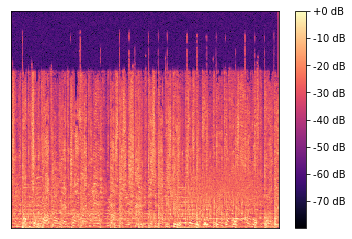

In [31]:
#Convert dream back to audio
backToSpectro = librosa.power_to_db(sUtils.unscaleSpectro(dreamSpectro, origSpectroSize, minAmp, maxAmp))
plt.figure()
librosa.display.specshow(backToSpectro)
plt.colorbar(format='%+2.0f dB')
plt.show()

In [32]:
backToSpectro = librosa.core.db_to_power(backToSpectro)
backToPhase = sUtils.unscalePhase(dreamPhase, origSpectroSize, -math.pi, math.pi)
invStft = np.zeros(backToSpectro.shape, dtype=np.complex_)
for i in range(invStft.shape[0]):
    for j in range(invStft.shape[1]):
        invStft[i,j] = complex(backToSpectro[i,j]*math.cos(backToPhase[i,j]), backToSpectro[i,j]*math.sin(backToPhase[i,j]))
n = len(x)
y_hat = librosa.istft(invStft, length = n)
ipd.Audio(data=y_hat[start*sr:end*sr], rate=sr)

In [33]:
librosa.output.write_wav('dreamExample.wav', y_hat, sr)

## Noise Dream

In [34]:
noiseSpectro = np.random.random(spectroSize)*255
noisePhase = np.random.random(spectroSize)*2*math.pi - math.pi
backToNoiseSpectro = librosa.core.db_to_power(sUtils.unscaleSpectro(noiseSpectro, origSpectroSize, minAmp, maxAmp))
backToNoisePhase = sUtils.unscalePhase(noisePhase, origSpectroSize, -math.pi, math.pi)
invStftNoise = np.zeros(backToNoiseSpectro.shape, dtype=np.complex_)
for i in range(invStftNoise.shape[0]):
    for j in range(invStftNoise.shape[1]):
        invStftNoise[i,j] = complex(backToNoiseSpectro[i,j]*math.cos(backToNoisePhase[i,j]), backToNoiseSpectro[i,j]*math.sin(backToNoisePhase[i,j]))
n = len(x)
y_hat = librosa.istft(invStftNoise, length = n)
ipd.Audio(data=y_hat[start*sr:end*sr], rate=sr)


In [35]:
noiseSpectro = np.expand_dims(np.expand_dims(noiseSpectro, 0),0).astype(np.float32)
noisePhase = np.expand_dims(np.expand_dims(noisePhase, 0),0).astype(np.float32)

In [36]:
modelMag = resnet18(channel=1, num_classes=4).cuda()
modelPhase = resnet18(channel=1, num_classes=4).cuda()

1
1


In [37]:
checkpoint = torch.load('new_model/checkpoints/checkpoints_magnitude/checkpoints/model_best.pth.tar')
modelMag.load_state_dict(checkpoint['state_dict'])
checkpoint = torch.load('new_model/checkpoints/checkpoints_phase/model_best.pth.tar')
modelPhase.load_state_dict(checkpoint['state_dict'])

modelMag = nn.Sequential(*list(modelMag.children())[:-3])
modelPhase = nn.Sequential(*list(modelPhase.children())[:-3])

In [38]:
print ("noiseSpectro.shape", noiseSpectro.shape)
dreamNoiseSpectro = dream(modelMag, noiseSpectro)
dreamNoiseSpectro = dreamNoiseSpectro[0,0,:]
print ("dreamNoiseSpectro")
print (dreamNoiseSpectro)

noiseSpectro.shape (1, 1, 512, 512)
model after removing 7
(1, 1, 95, 95)
ratio 0.10118134
learning_rate_use 3.953297983185976
imgBefore [[[[240.86763  118.70041  137.36363  ... 156.0146   140.92636
    201.74767 ]
   [127.77492  118.76961  123.09392  ... 138.91391  140.70642
    148.31114 ]
   [129.39134  116.54777  135.55649  ... 126.082436 139.36201
    156.71532 ]
   ...
   [137.39758  135.81444  138.38269  ... 141.83603  124.98637
    144.45973 ]
   [ 99.03735  131.05139  147.94505  ... 139.73361  127.72377
    138.41083 ]
   [ 39.42793  109.48     182.40375  ... 128.08151  155.86858
    204.51894 ]]]]
imgAfter (1, 1, 95, 95)
ratio 0.11495188
learning_rate_use 3.4797169408979958
imgBefore [[[[240.32481  118.23693  137.36058  ... 155.98453  140.55977
    201.16669 ]
   [128.1967   118.56759  123.24081  ... 138.84683  140.08125
    148.42674 ]
   [130.10948  116.90174  135.3894   ... 126.582245 139.6249
    157.18224 ]
   ...
   [137.62004  136.58987  138.29681  ... 141.47713  124.3

/home/iaakhter/.conda/envs/mypy35/lib/python3.5/site-packages/scipy/ndimage/interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


ratio 0.10902221
learning_rate_use 3.668977256644069
imgBefore [[[[238.81801 116.98662 138.17877 ... 155.80699 140.14032 204.35202]
   [128.77475 118.19233 124.40755 ... 138.37428 141.71532 147.96156]
   [131.51472 115.69693 134.88768 ... 127.16535 140.20511 157.84387]
   ...
   [138.26106 136.9738  137.8721  ... 141.31955 121.97165 144.42064]
   [100.94891 131.82407 147.36252 ... 140.78836 125.41718 136.80078]
   [ 41.84378 108.5721  182.63686 ... 129.2326  155.31789 203.92218]]]]
imgAfter (1, 1, 95, 95)
ratio 0.10663168
learning_rate_use 3.751230357028317
imgBefore [[[[240.34012 117.73995 138.99342 ... 154.92978 139.94698 205.62709]
   [129.10608 116.96788 123.79054 ... 138.86241 142.145   148.30577]
   [130.56116 114.89234 135.6426  ... 127.41705 140.04402 157.25075]
   ...
   [138.33133 136.56438 138.1508  ... 141.78296 121.8529  144.44403]
   [100.43593 131.13396 147.69095 ... 140.29161 125.11933 136.88489]
   [ 42.20151 108.71756 184.12785 ... 129.30417 155.06972 204.4287 ]]]]
im

imgBefore [[[[236.76515  112.797806 121.71125  ... 134.22469  151.77693
    202.87025 ]
   [131.97758  124.97467  117.191925 ... 149.69025  146.64763
    146.05766 ]
   [116.00234  108.46752  116.56936  ... 143.10736  142.53787
    151.97952 ]
   ...
   [ 69.75089  127.198166 125.08064  ... 135.24582  134.46844
    130.45166 ]
   [117.16292  135.68166  141.65074  ... 127.1028   110.22437
    133.58842 ]
   [ 39.75701  104.83401  111.338104 ... 157.73502  156.19513
    205.40417 ]]]]
imgAfter (1, 1, 133, 133)
ratio 0.10926397
learning_rate_use 3.6608590617682917
imgBefore [[[[235.34167  112.49698  120.811356 ... 135.16075  152.4742
    201.69275 ]
   [131.61441  125.08314  118.043144 ... 150.72058  147.23476
    146.14781 ]
   [115.08755  108.324165 116.79976  ... 143.40349  142.5315
    151.90274 ]
   ...
   [ 69.25524  128.12558  124.807976 ... 135.65082  135.08174
    130.4894  ]
   [117.7914   135.19925  141.32646  ... 127.99593  111.26126
    133.2251  ]
   [ 38.941154 103.40209  1

learning_rate_use 4.185637115148446
imgBefore [[[[236.26984  141.76143  117.06206  ... 175.08868  144.65044
    194.71678 ]
   [ 79.17606  122.10943  133.13289  ... 146.37994  129.2414
    109.51627 ]
   [193.69412  166.36032   77.77665  ... 151.00272  178.41475
    113.02758 ]
   ...
   [ 84.13304  139.33583  168.07333  ... 144.16628  124.67729
     85.82014 ]
   [171.04588  135.81528  181.96252  ... 103.002396 112.62053
    142.12593 ]
   [ 41.06556   68.94238   73.499016 ...  83.61918  187.15807
    201.44226 ]]]]
imgAfter (1, 1, 261, 261)
ratio 0.09207893
learning_rate_use 4.344099056327059
imgBefore [[[[236.41956  142.02815  117.23937  ... 174.9484   144.15059
    194.18443 ]
   [ 79.30437  122.18017  134.14381  ... 145.78644  128.21283
    109.11321 ]
   [193.42105  166.4293    78.0304   ... 150.39307  177.96785
    113.01061 ]
   ...
   [ 84.05556  139.23264  168.28882  ... 143.8386   124.13673
     85.592896]
   [170.95753  135.89778  181.87405  ... 102.91479  112.50949
    142

ratio 0.0797278
learning_rate_use 5.017070664442302
imgBefore [[[[234.08337  114.66935  182.60197  ... 185.49878  115.030106
    190.97319 ]
   [ 68.44443   89.842896  95.85027  ...  76.2941   156.41061
    129.61456 ]
   [ 94.583    183.09193  145.55173  ... 153.2046   116.57961
     70.94577 ]
   ...
   [157.43599  178.31741  129.10786  ... 122.30344  127.20156
     87.17997 ]
   [180.25406  129.79733  107.43504  ... 130.96857   85.024124
    179.31358 ]
   [ 39.5836    35.09588  114.74785  ... 217.66084  162.57892
    196.8334  ]]]]
imgAfter (1, 1, 366, 366)
ratio 0.08062982
learning_rate_use 4.960943844598816
imgBefore [[[[234.126    114.23524  182.41592  ... 185.20671  115.721275
    191.15932 ]
   [ 68.50766   89.42067   95.62099  ...  76.06537  156.8168
    129.7399  ]
   [ 94.04551  183.3248   145.64012  ... 152.82928  117.004486
     69.78659 ]
   ...
   [156.91965  177.8587   128.41025  ... 122.468506 127.59994
     87.411964]
   [181.46368  129.67696  107.11851  ... 130.5758

ratio 0.08051688
learning_rate_use 4.9679022444493945
imgBefore [[[[233.75336  114.183395 185.56404  ... 184.8682   114.65665
    189.83499 ]
   [ 69.94787   87.704926  95.8282   ...  78.3223   158.13055
    130.48994 ]
   [ 96.11955  183.78542  146.37178  ... 152.79271  118.78462
     68.09932 ]
   ...
   [157.52638  179.33244  130.18501  ... 122.07933  128.75859
     89.66815 ]
   [180.2347   127.94668  103.88612  ... 130.69794   86.51539
    176.37027 ]
   [ 36.822914  32.54191  112.229675 ... 214.02623  161.60294
    193.53195 ]]]]
imgAfter (1, 1, 366, 366)
(1, 1, 512, 512)
ratio 0.062995054
learning_rate_use 6.349704868792662
imgBefore [[[[233.65433   166.124      39.524918  ... 194.26886    62.01172
    190.79752  ]
   [ 40.809067    7.5769863  32.83045   ... 162.67165   199.34148
     65.23503  ]
   [113.25108   234.01833   144.63182   ...  31.639997  176.90645
    227.03651  ]
   ...
   [ 85.55467    72.93917   131.8461    ...  40.79355    24.099281
    229.89381  ]
   [242.700

ratio 0.062743515
learning_rate_use 6.375160866052383
imgBefore [[[[235.03993   169.31453    38.233223  ... 196.21606    61.519928
    192.56331  ]
   [ 41.979206    4.8537517  30.143414  ... 160.8223    200.11877
     66.16965  ]
   [116.09187   234.8763    146.23337   ...  31.31768   176.03847
    229.81671  ]
   ...
   [ 83.55562    69.406456  128.5651    ...  39.012745   25.885235
    229.27423  ]
   [242.13191    95.85014   228.04793   ... 252.83766    32.627483
    142.99257  ]
   [ 39.055317   47.139046   12.2041645 ... 124.91712   187.1684
    191.7523   ]]]]
imgAfter (1, 1, 512, 512)
ratio 0.06281282
learning_rate_use 6.368126753583437
imgBefore [[[[235.4984    169.33183    37.72519   ... 196.54634    61.59466
    192.86006  ]
   [ 42.048264    4.5461593  29.90463   ... 160.64314   200.13112
     66.62294  ]
   [116.26052   234.57031   146.45432   ...  31.549847  176.29214
    229.86923  ]
   ...
   [ 83.60604    69.349144  128.6893    ...  39.065823   25.782501
    229.39397 

In [39]:
dreamNoisePhase = dream(modelPhase, noisePhase)
dreamNoisePhase = dreamNoisePhase[0,0,:]
print ("dreamNoisePhase")
print (dreamNoisePhase)

model after removing 7
(1, 1, 95, 95)
ratio 15.588939
learning_rate_use 0.025659219486477185
imgBefore [[[[-1.4134244  -0.93277913  0.57129997 ... -1.063142   -0.36513066
     2.9653819 ]
   [-0.9782061   0.09368756  0.04647315 ...  0.11381996  0.34391224
     0.18795885]
   [-1.311605   -0.6215181   0.4371321  ...  0.9678478  -0.09613077
     0.78562146]
   ...
   [ 0.5809506   0.01943822  0.7390842  ... -0.43354192  0.0547189
     0.18977898]
   [-0.15408564 -0.29857117 -0.07519469 ... -0.01420918 -0.87758577
     0.18430471]
   [-0.7742737  -0.21001284 -0.5498072  ... -1.6723195   0.06781629
     2.3646312 ]]]]
imgAfter (1, 1, 95, 95)
ratio 8.899481
learning_rate_use 0.04494644216935201
imgBefore [[[[-0.7137514   0.94024396 -0.30211002 ... -2.3299365   0.21593218
     4.820379  ]
   [ 0.34854496 -0.346237   -0.39321297 ... -0.4322245   0.64348006
    -1.716647  ]
   [ 0.4669923   0.31365076 -0.58720434 ...  1.2960141  -0.8665394
     2.1989274 ]
   ...
   [ 1.2858435   0.40591437  1

/home/iaakhter/.conda/envs/mypy35/lib/python3.5/site-packages/scipy/ndimage/interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)



imgBefore [[[[ 1.0323817   0.26774982  1.9626002  ...  2.45194     2.134397
     5.8795033 ]
   [ 0.55738366  3.795535   -0.25332147 ...  1.4742907   1.9173479
     0.29962492]
   [ 2.590714    0.5713476   0.45968634 ...  0.76841146  2.6042223
     0.16919252]
   ...
   [ 4.4691596   0.46780133  3.3085191  ...  1.329521    1.3796419
     0.28408697]
   [ 3.0248058   0.13182837 -0.14715454 ...  1.8215429   3.583682
     0.28157642]
   [ 1.0283169   2.208652   -0.6647644  ...  0.28757298  3.7345123
     0.7526082 ]]]]
imgAfter (1, 1, 95, 95)
ratio 2.5100336
learning_rate_use 0.15936041605479717
imgBefore [[[[ 0.9561565   0.38358328  2.0114682  ...  2.1245525   2.1903567
     6.0489993 ]
   [ 0.40015596  3.6813169   0.07350739 ...  1.3855957   1.9375414
     0.13724148]
   [ 2.4203653   0.8389031   0.54529124 ...  0.72221553  3.0079525
     0.15118843]
   ...
   [ 4.7309475   0.3535018   3.0331893  ...  1.4323978   1.579264
     0.29359823]
   [ 3.1124444  -0.02768406 -0.08185205 ...  1.

ratio 1.6699773
learning_rate_use 0.23952421284215586
imgBefore [[[[2.234795   1.3743074  2.7178464  ... 3.2104702  2.2262523
    5.442561  ]
   [0.35082382 2.8524137  1.1384108  ... 1.1071326  2.6668513
    1.9463179 ]
   [0.95656025 2.0174448  1.8976291  ... 3.151929   2.9284182
    2.072648  ]
   ...
   [3.4779832  3.5125973  2.108839   ... 5.7633915  1.9866061
    3.1392176 ]
   [1.7116344  3.2776785  0.75419956 ... 5.8709345  5.4910784
    2.07796   ]
   [2.5520465  3.7076874  1.5008214  ... 2.1872745  2.798095
    0.4678695 ]]]]
imgAfter (1, 1, 133, 133)
ratio 1.651865
learning_rate_use 0.24215053813103818
imgBefore [[[[2.516126   1.3854972  2.2332664  ... 3.5308146  2.39818
    5.2400074 ]
   [0.1853631  2.5414367  1.2053564  ... 1.1191846  2.7202737
    2.6053033 ]
   [0.7073962  2.0834982  2.21804    ... 3.7516155  3.4264266
    2.4155438 ]
   ...
   [3.5231237  3.6028295  2.8262537  ... 5.889645   1.3059354
    3.1967292 ]
   [2.3300948  3.5190222  0.4023866  ... 5.5917096  6

ratio 1.4052606
learning_rate_use 0.284644720389407
imgBefore [[[[ 1.4883885   1.0418136   1.0258532  ...  3.4777381   4.3386517
     4.1724105 ]
   [ 0.91402876  3.6746986   2.271124   ...  3.0506804   2.0640435
     1.4043388 ]
   [ 0.8851457   2.3192728   2.5101612  ...  1.6121219   4.6690593
     2.2937171 ]
   ...
   [ 3.8336937   4.389353    3.5660703  ...  5.940037    2.52396
     3.6017652 ]
   [ 3.026332    1.946778    1.2461908  ...  2.6572309   4.0127025
     0.64961284]
   [ 4.6752834   2.86299     4.813595   ...  5.0955586   1.280684
    -0.06304611]]]]
imgAfter (1, 1, 186, 186)
ratio 1.459254
learning_rate_use 0.27411265808411167
imgBefore [[[[ 1.506094    1.1626534   0.9980384  ...  4.254301    4.3476515
     4.092335  ]
   [ 1.1543524   3.551007    2.5252173  ...  2.8035994   2.4275646
     1.2570945 ]
   [ 0.7911154   2.3582842   2.478632   ...  1.6496217   4.5154696
     1.99254   ]
   ...
   [ 4.536255    4.4846125   3.8085985  ...  6.2919025   2.5536926
     4.05721

imgBefore [[[[ 2.8931623   0.35628003  1.641785   ...  1.309077    3.9561865
     3.3497708 ]
   [ 2.1285195   2.6730413   3.79911    ...  2.4645991   0.09811884
     1.3431919 ]
   [ 0.10177055  5.311328    2.026745   ...  2.8192449   2.6894968
     0.50178945]
   ...
   [ 1.5197418   4.0287704   2.8996215  ...  4.2279935   1.8516314
     2.467471  ]
   [ 4.9715223   2.1529264   1.4280124  ...  2.3572435   4.3179183
     0.7043202 ]
   [ 7.6019397   6.0048885   2.7393217  ...  4.2323775  -0.04549542
     0.3216021 ]]]]
imgAfter (1, 1, 261, 261)
ratio 1.3305353
learning_rate_use 0.3006308830866978
imgBefore [[[[ 2.845673    0.15401995  1.7255071  ...  1.2659779   4.023442
     3.4865196 ]
   [ 2.2655568   2.7066824   3.8031428  ...  2.532832    0.27897525
     1.7834288 ]
   [ 0.05717744  5.295577    2.1120007  ...  2.6978884   2.7435536
     0.9826359 ]
   ...
   [ 0.8561021   3.931172    3.0341709  ...  4.372254    1.5592743
     2.421182  ]
   [ 5.47267     1.8885144   1.3164967  ..

imgBefore [[[[ 1.2262294   1.8515561   0.8606359  ...  2.9921217   2.4181
     3.4204702 ]
   [ 3.383733    3.244022    2.3789046  ...  2.1805072   1.0718882
     1.0046921 ]
   [ 3.4421768   1.4678273   3.9066     ...  2.4397616   2.2272549
     1.6524574 ]
   ...
   [ 1.4590776   1.59937     1.255652   ...  4.2473793   6.198202
     3.12204   ]
   [ 8.33648     1.8490734   1.212787   ...  2.6678443   4.34845
     0.7410208 ]
   [ 8.661537    5.9481077   6.394732   ...  0.4970952  -0.08791883
     0.8422287 ]]]]
imgAfter (1, 1, 366, 366)
ratio 1.2357433
learning_rate_use 0.3236918258881828
imgBefore [[[[ 2.1020646   1.3927498   1.634748   ...  3.051113    2.3758483
     3.5995786 ]
   [ 3.5651908   3.197211    2.5008385  ...  2.1144812   1.0887303
     1.0058637 ]
   [ 3.5272431   1.2409726   4.1542892  ...  2.431371    2.4751513
     1.4215623 ]
   ...
   [ 1.766276    1.5840495   1.1419257  ...  4.2535605   6.420694
     3.3472695 ]
   [ 8.408499    1.8747269   1.1819123  ...  2.751

ratio 0.9008091
learning_rate_use 0.4440452432262435
imgBefore [[[[3.0516691  0.9417647  2.063244   ... 4.9024167  3.428361
    3.6869848 ]
   [3.6177075  3.1062355  1.7942778  ... 3.6961627  0.01110206
    2.0307236 ]
   [4.859094   0.04360256 3.7504597  ... 0.29688454 2.739349
    2.1520844 ]
   ...
   [1.7762713  1.431126   2.176816   ... 4.61015    6.3558564
    3.5642257 ]
   [7.436437   0.51498866 3.6146648  ... 3.785083   3.3598244
    0.8606279 ]
   [6.555168   4.7893977  4.6291494  ... 1.0502411  1.0538512
    0.9490292 ]]]]
imgAfter (1, 1, 366, 366)
ratio 0.8456306
learning_rate_use 0.47301978730736244
imgBefore [[[[ 3.210929    1.2746804   2.3147495  ...  4.9768434   3.5947962
     3.9637427 ]
   [ 3.6756184   3.260519    1.9092846  ...  3.4935658  -0.07468593
     1.4527973 ]
   [ 5.106262    0.34831464  3.5399632  ...  0.35938442  2.6824965
     2.268413  ]
   ...
   [ 1.5606469   1.7489128   2.2514443  ...  4.814337    5.8135533
     3.3544497 ]
   [ 7.1853213   0.0940037

ratio 0.8469738
learning_rate_use 0.4722696392125413
imgBefore [[[[ 3.1467285   0.69198555  0.44552976 ...  4.5447373   4.9465632
     5.0679502 ]
   [ 4.3271437   2.876091    0.7988949  ...  2.4115498  -0.40090683
     1.5526097 ]
   [ 3.2218478   4.4790087   1.9334025  ...  0.84020454  1.4972565
    -0.89853555]
   ...
   [ 8.6005535   3.027741    1.929388   ...  5.791286    6.430737
     0.48933923]
   [ 7.8250494   4.176449    0.386757   ...  0.4668886   4.1147466
     2.7681015 ]
   [ 6.1487885   7.5989084   3.6526213  ...  1.1460161   2.0294173
    -0.33641112]]]]
imgAfter (1, 1, 512, 512)
ratio 0.82477903
learning_rate_use 0.48497838048155534
imgBefore [[[[ 3.3665147   0.43023634 -0.21091592 ...  4.935349    4.747102
     5.4689407 ]
   [ 4.5546064   2.8580153   0.39463815 ...  2.2680006  -0.33616388
     1.1437439 ]
   [ 3.2121208   4.587592    2.3243663  ... -0.02766681  1.5193095
     0.1591161 ]
   ...
   [ 8.617208    2.9253657   2.2333412  ...  5.9582143   6.3479795
     0

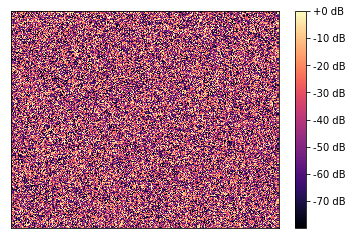

In [40]:
backToSpectro = librosa.power_to_db(sUtils.unscaleSpectro(dreamNoiseSpectro, origSpectroSize, minAmp, maxAmp))
plt.figure()
librosa.display.specshow(backToSpectro)
plt.colorbar(format='%+2.0f dB')
plt.show()

In [41]:
backToSpectro = librosa.core.db_to_power(backToSpectro)
backToPhase = sUtils.unscalePhase(dreamPhase, origSpectroSize, -math.pi, math.pi)
invStft = np.zeros(backToSpectro.shape, dtype=np.complex_)
for i in range(invStft.shape[0]):
    for j in range(invStft.shape[1]):
        invStft[i,j] = complex(backToSpectro[i,j]*math.cos(backToPhase[i,j]), backToSpectro[i,j]*math.sin(backToPhase[i,j]))
n = len(x)
y_hat = librosa.istft(invStft, length = n)
ipd.Audio(data=y_hat[start*sr:end*sr], rate=sr)

In [42]:
librosa.output.write_wav('dreamNoiseExample.wav', y_hat, sr)

## Control The Dream

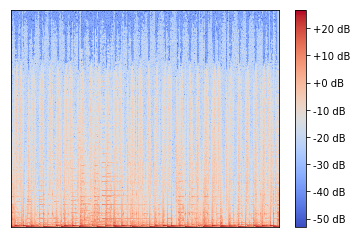

In [62]:
#spectroSize = 224
otherTrackId = 1482
audioFilename = audioDirectory + "001/001482.mp3"
x, sr = librosa.load(audioFilename, sr=None, mono=True, duration = 10, offset = 0)

otherSpectro = librosa.core.stft(x)
origSpectroSize = spectro.shape
spectroSize = (512, 512)
otherScaledSpectro = librosa.power_to_db(np.abs(otherSpectro))

plt.figure()
librosa.display.specshow(otherScaledSpectro)
plt.colorbar(format='%+2.0f dB')
plt.show()


In [63]:
otherScaledSpectro = sUtils.scaleSpectro(otherScaledSpectro, spectroSize, minAmp, maxAmp)
otherScaledPhase = sUtils.scalePhase(np.angle(otherSpectro), spectroSize, -math.pi, math.pi)

start, end = 0, 10
ipd.Audio(data=x[start*sr:end*sr], rate=sr)

In [64]:
modelMag = resnet18(channel=1, num_classes=4).cuda()
checkpoint = torch.load('new_model/checkpoints/checkpoints_magnitude/checkpoints/model_best.pth.tar')
modelMag.load_state_dict(checkpoint['state_dict'])
modelPhase = resnet18(channel=1, num_classes=4).cuda()
checkpoint = torch.load('new_model/checkpoints/checkpoints_phase/model_best.pth.tar')
modelPhase.load_state_dict(checkpoint['state_dict'])

modelMag = nn.Sequential(*list(modelMag.children())[:-5])
modelPhase = nn.Sequential(*list(modelPhase.children())[:-5])

1
1


In [65]:
otherScaledSpectro = torch.Tensor(np.expand_dims(np.expand_dims(otherScaledSpectro, 0),0).astype(np.float32)).cuda()
otherScaledSpectro = Variable(otherScaledSpectro)

otherScaledPhase = torch.Tensor(np.expand_dims(np.expand_dims(otherScaledPhase, 0),0).astype(np.float32)).cuda()
otherScaledPhase = Variable(otherScaledPhase)

control_features_mag = modelMag.forward(otherScaledSpectro)
control_features_phase = modelPhase.forward(otherScaledPhase)
control_features_mag = control_features_mag.cpu().data.numpy()
control_features_phase = control_features_phase.cpu().data.numpy()

In [66]:
def objective_guide(dst, guide_features):
    x = dst.data[0].cpu().numpy().copy()
    #print ("guide_features", guide_features.shape)
    y = guide_features
    ch,w, h = x.shape
    #ch = 1
    x = x.reshape(ch,-1)
    y = y.reshape(ch,-1)
    print ("shape of x", x.shape)
    print ("shape of y", y.shape)
    #A = x.T.dot(y) # compute the matrix of dot-products with guide features
    #A = torch.mm(torch.from_numpy(x.T).type(torch.DoubleTensor), torch.from_numpy(y).type(torch.DoubleTensor)).numpy()
    #A = np.zeros((x.shape[1],y.shape[1]))
    '''maxColumnIndices = []
    batchSize = 9000
    numBatches = x.shape[1]//batchSize
    for batchNum in range(numBatches):
        start = batchNum*batchSize
        end = start+batchSize
        if batchNum == numBatches-1:
            end = x.shape[1]
        #print ("x portion shape", (x[0,start:end].T).shape)
        #print ("y portion shape", (y).shape)
        prod = np.dot((x[0,start:end].T).reshape(-1,1), y)
        argMax = prod.argmax(1)
        for val in list(argMax):
            maxColumnIndices.append(val)
        del prod
    #print ("shape of A", A.shape)
    #result = y[:,A.argmax(1)] # select ones that match best
    #print ("shape of result", result.shape)
    result = y[:,maxColumnIndices]'''
    A = x.T.dot(y) # compute the matrix of dot-products with guide features
    result = y[:,A.argmax(1)] # select ones that match best
    print ("shape of result", result.shape)
    if torch.cuda.is_available():
        result = torch.Tensor(np.array([result.reshape(ch, w, h)], dtype=np.float)).cuda()
    else:
        result = torch.Tensor(np.array([result.reshape(ch, w, h)], dtype=np.float))
    return result

In [67]:
hopRockDreamSpectro = dream(modelMag, scaledSpectro, control=control_features_mag, distance=objective_guide, layerNumber=3)
print(hopRockDreamSpectro)

model after removing 5
(1, 1, 95, 95)
shape of x (64, 576)
shape of y (64, 16384)
shape of result (64, 576)
ratio 0.20011486
learning_rate_use 1.998852047968198
imgBefore [[[[113.03775    179.37265    187.98001    ... 190.26067
    201.2865     194.9423    ]
   [109.35481    184.63878    188.29922    ... 205.80553
    204.832      195.38031   ]
   [102.44503    181.49547    192.35977    ... 200.0002
    207.28816    205.3002    ]
   ...
   [ 25.461826    59.019978    57.59785    ...  58.75202
     60.496914   123.95245   ]
   [ 21.184824    58.226013    57.44893    ...  58.11599
     60.162983   123.64019   ]
   [ -0.27363482  59.404472    58.64351    ...  56.528744
     58.237812   123.62897   ]]]]
imgAfter (1, 1, 95, 95)
shape of x (64, 576)
shape of y (64, 16384)
shape of result (64, 576)
ratio 0.2193919
learning_rate_use 1.8232213900552878
imgBefore [[[[1.13004356e+02 1.78631454e+02 1.87700348e+02 ... 1.89580475e+02
    2.01310364e+02 1.94370499e+02]
   [1.09393349e+02 1.83981415e+

/home/iaakhter/.conda/envs/mypy35/lib/python3.5/site-packages/scipy/ndimage/interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


shape of result (64, 576)
ratio 0.2093886
learning_rate_use 1.9103236866426874
imgBefore [[[[ 1.12010101e+02  1.78257919e+02  1.88550446e+02 ...  1.89665955e+02
     2.02711700e+02  1.93969666e+02]
   [ 1.07867554e+02  1.81820999e+02  1.86766174e+02 ...  2.06256699e+02
     2.05628448e+02  1.94421585e+02]
   [ 1.01073082e+02  1.80123596e+02  1.91754135e+02 ...  2.00115845e+02
     2.06645630e+02  2.04029648e+02]
   ...
   [ 2.65357227e+01  5.99442139e+01  5.83181686e+01 ...  5.93624306e+01
     6.13645821e+01  1.24438004e+02]
   [ 2.15830078e+01  5.84997520e+01  5.80210266e+01 ...  5.87707138e+01
     6.14280014e+01  1.25145439e+02]
   [-1.26203477e-01  5.87989540e+01  5.82870255e+01 ...  5.46993828e+01
     5.89476128e+01  1.24645294e+02]]]]
imgAfter (1, 1, 95, 95)
shape of x (64, 576)
shape of y (64, 16384)
shape of result (64, 576)
ratio 0.2047162
learning_rate_use 1.9539244527987218
imgBefore [[[[111.08684   178.01169   188.2051    ... 190.58038   204.2214
    193.68501  ]
   [107.

shape of y (64, 16384)
shape of result (64, 1156)
ratio 0.18546246
learning_rate_use 2.1567707026455922
imgBefore [[[[109.20893   170.9276    179.3452    ... 199.9464    217.5957
    198.18945  ]
   [ 99.181305  178.03278   180.77762   ... 220.34114   209.5182
    182.68585  ]
   [102.93898   167.3199    180.07924   ... 209.1246    209.51306
    205.75444  ]
   ...
   [ 22.309994   57.551952   55.95715   ...  59.191143   65.721565
    127.47595  ]
   [ 21.381464   56.17265    58.132347  ...  60.569942   61.5112
    127.06716  ]
   [  0.5827235  58.021736   54.308907  ...  56.321957   61.852455
    126.86957  ]]]]
imgAfter (1, 1, 133, 133)
shape of x (64, 1156)
shape of y (64, 16384)
shape of result (64, 1156)
ratio 0.2012095
learning_rate_use 1.9879777005616777
imgBefore [[[[ 1.08750671e+02  1.71652725e+02  1.80374878e+02 ...  2.00802795e+02
     2.18594376e+02  1.98170044e+02]
   [ 9.83904877e+01  1.78008606e+02  1.80810059e+02 ...  2.21667145e+02
     2.09816986e+02  1.81972610e+02]


imgAfter (1, 1, 133, 133)
shape of x (64, 1156)
shape of y (64, 16384)
shape of result (64, 1156)
ratio 0.1738811
learning_rate_use 2.3004225482590015
imgBefore [[[[107.170425   170.48509    184.48648    ... 201.38867
    226.0298     198.6755    ]
   [ 97.55083    177.34389    177.94777    ... 228.71933
    221.07866    184.54855   ]
   [ 96.430954   159.03944    175.20723    ... 212.49203
    215.01033    205.18335   ]
   ...
   [ 27.88937     60.560093    56.814384   ...  61.95899
     72.10225    131.33469   ]
   [ 20.341007    53.73764     57.845825   ...  59.5665
     64.2467     131.19814   ]
   [ -0.30703214  53.165363    57.108116   ...  53.700348
     64.976585   126.382515  ]]]]
imgAfter (1, 1, 133, 133)
shape of x (64, 1156)
shape of y (64, 16384)
shape of result (64, 1156)
ratio 0.17295952
learning_rate_use 2.3126798497852654
imgBefore [[[[106.96837    171.13736    185.7278     ... 202.59267
    227.58885    199.33582   ]
   [ 97.505325   177.44809    178.39821    ... 230.

shape of result (64, 2209)
ratio 0.2005683
learning_rate_use 1.9943330680269729
imgBefore [[[[104.588455  164.81075   180.2294    ... 232.40492   228.1839
    202.54866  ]
   [ 99.338326  170.32004   174.57355   ... 236.8702    212.25462
    176.4887   ]
   [ 84.4657    182.05432   181.92076   ... 230.11511   211.66994
    194.3637   ]
   ...
   [ 33.280308   58.110474   61.91262   ...  66.32645    66.33042
    134.24466  ]
   [ 15.627162   50.35979    56.984074  ...  62.40165    65.4025
    133.59686  ]
   [  0.5322794  52.800343   56.93953   ...  55.082554   71.59003
    129.95961  ]]]]
imgAfter (1, 1, 186, 186)
shape of x (64, 2209)
shape of y (64, 16384)
shape of result (64, 2209)
ratio 0.18896694
learning_rate_use 2.1167723296489487
imgBefore [[[[104.24458    164.59332    180.28288    ... 233.54611
    228.85638    202.87437   ]
   [ 99.071526   170.32228    174.69576    ... 237.16554
    212.78006    176.69576   ]
   [ 83.86369    182.26094    182.26979    ... 230.19995
    211.3

shape of result (64, 2209)
ratio 0.17371549
learning_rate_use 2.3026156540541916
imgBefore [[[[1.0439085e+02 1.6375699e+02 1.8202032e+02 ... 2.3750174e+02
    2.3566022e+02 2.0174286e+02]
   [9.8767578e+01 1.6783525e+02 1.7917192e+02 ... 2.4262595e+02
    2.1437407e+02 1.7279614e+02]
   [8.1694000e+01 1.8218066e+02 1.8444730e+02 ... 2.2807751e+02
    2.0713486e+02 1.9003491e+02]
   ...
   [3.5163742e+01 5.8332165e+01 6.4520775e+01 ... 6.9011810e+01
    7.0560249e+01 1.4046860e+02]
   [1.3182594e+01 4.7172195e+01 5.6087856e+01 ... 6.4471558e+01
    6.7059715e+01 1.3579697e+02]
   [2.0963836e-01 5.0652252e+01 5.9610874e+01 ... 5.5167667e+01
    7.6115318e+01 1.3284383e+02]]]]
imgAfter (1, 1, 186, 186)
(1, 1, 261, 261)
shape of x (64, 4356)
shape of y (64, 16384)
shape of result (64, 4356)
ratio 0.19507839
learning_rate_use 2.0504577897899927
imgBefore [[[[1.0421730e+02 1.6297539e+02 1.7217970e+02 ... 2.3925395e+02
    2.2658044e+02 2.0133377e+02]
   [1.0220727e+02 1.6112737e+02 1.6816106

ratio 0.17978431
learning_rate_use 2.22488822117905
imgBefore [[[[104.20638   158.02689   166.716     ... 239.0333    231.79503
    202.28629  ]
   [101.62343   157.43124   169.56194   ... 220.20415   200.40952
    161.465    ]
   [ 87.79906   182.2952    177.91241   ... 223.33434   205.14645
    176.48532  ]
   ...
   [ 31.573902   53.787018   58.99016   ...  71.50264    69.56735
    139.4569   ]
   [  7.6306133  48.23664    45.083084  ...  67.20987    72.00103
    139.47162  ]
   [  2.367353   51.168056   53.135372  ...  77.94247    74.61702
    136.631    ]]]]
imgAfter (1, 1, 261, 261)
shape of x (64, 4356)
shape of y (64, 16384)
shape of result (64, 4356)
ratio 0.1798264
learning_rate_use 2.224367578738551
imgBefore [[[[104.27504   157.8186    166.84998   ... 239.1772    231.83983
    201.7413   ]
   [101.37237   157.40973   169.85374   ... 220.00111   200.10884
    160.68253  ]
   [ 87.508514  182.57834   178.61986   ... 221.6723    203.82155
    175.34517  ]
   ...
   [ 31.520296

shape of result (64, 8464)
ratio 0.1873093
learning_rate_use 2.1355053422745414
imgBefore [[[[102.876854 154.85574  158.56479  ... 237.38809  228.05298
    204.25204 ]
   [ 94.719666 141.53738  153.4096   ... 204.54811  184.08655
    167.52884 ]
   [101.52489  171.24905  177.29099  ... 216.64546  195.47282
    138.10039 ]
   ...
   [  7.621655  51.361317  59.169197 ...  72.20493   76.40943
    143.29683 ]
   [ 16.497078  48.55802   55.470123 ...  71.84969   79.48802
    144.29874 ]
   [  5.11268   58.18896   45.079247 ...  81.07849   72.25975
    141.23463 ]]]]
imgAfter (1, 1, 366, 366)
shape of x (64, 8464)
shape of y (64, 16384)
shape of result (64, 8464)
ratio 0.19027309
learning_rate_use 2.1022415596634696
imgBefore [[[[102.87584  154.36209  158.84448  ... 238.23337  229.15721
    205.43045 ]
   [ 95.01624  140.70863  152.7568   ... 204.90115  183.97672
    167.96252 ]
   [101.14602  169.96184  177.75967  ... 215.30804  194.79619
    137.9862  ]
   ...
   [  7.89221   51.532406  59

shape of result (64, 8464)
ratio 0.17093778
learning_rate_use 2.340032777053273
imgBefore [[[[ 97.378555 149.13377  157.26595  ... 241.27583  235.49278
    205.65236 ]
   [ 93.9016   139.28859  154.40002  ... 205.50339  186.2841
    165.09377 ]
   [103.55766  172.68738  181.51811  ... 213.30728  189.37924
    130.45406 ]
   ...
   [  9.365372  51.923714  63.48257  ...  74.786606  79.5807
    147.50972 ]
   [ 17.39949   47.32921   57.365913 ...  69.6921    80.969894
    146.42671 ]
   [  5.669106  57.43738   48.263767 ...  84.96411   79.520515
    147.04854 ]]]]
imgAfter (1, 1, 366, 366)
shape of x (64, 8464)
shape of y (64, 16384)
shape of result (64, 8464)
ratio 0.17389145
learning_rate_use 2.3002855439293937
imgBefore [[[[ 97.13407   147.78255   157.45445   ... 242.88673   235.25934
    205.83363  ]
   [ 94.33141   138.92519   154.1647    ... 205.92786   185.80942
    165.87663  ]
   [104.214714  172.39648   181.9568    ... 212.38039   188.53398
    130.6071   ]
   ...
   [  9.802254

shape of y (64, 16384)
shape of result (64, 16384)
ratio 0.17957687
learning_rate_use 2.227458311205523
imgBefore [[[[ 95.46445  144.80806  157.7868   ... 242.45946  226.43721
    207.47461 ]
   [ 81.10429  133.65483  125.86001  ... 198.91208  164.90437
    166.58487 ]
   [101.45798  153.25104  165.19435  ... 191.86375  177.68442
    153.4481  ]
   ...
   [ 29.070715  38.468605  71.2915   ...  75.56627   84.21709
    150.38263 ]
   [ 20.58597   62.910404  41.318645 ...  81.86085   88.834724
    151.56833 ]
   [  9.809914  63.59946   55.31142  ...  87.20397   72.46627
    152.84741 ]]]]
imgAfter (1, 1, 512, 512)
shape of x (64, 16384)
shape of y (64, 16384)
shape of result (64, 16384)
ratio 0.1758491
learning_rate_use 2.2746776150867474
imgBefore [[[[ 95.06413  144.91908  157.10547  ... 242.85011  226.5026
    206.87982 ]
   [ 81.03956  133.72127  125.93784  ... 198.83852  165.26097
    166.26804 ]
   [100.56912  153.29729  165.69083  ... 190.12564  176.95856
    152.65807 ]
   ...
   [

In [68]:
hopRockDreamPhase = dream(modelPhase, scaledPhase, control=control_features_phase, distance=objective_guide, layerNumber=3)
print(hopRockDreamPhase)

model after removing 5
(1, 1, 95, 95)
shape of x (64, 576)
shape of y (64, 16384)
shape of result (64, 576)
ratio 0.54347134
learning_rate_use 0.7360093775608866
imgBefore [[[[  0.7034158 112.732765  103.03416   ... 111.87794   119.18925
    133.57079  ]
   [116.916794  126.94249   107.55663   ... 134.73843   135.1946
     88.97607  ]
   [144.22218   138.17293   127.93762   ... 141.26462   132.60085
    162.51454  ]
   ...
   [ 71.33595   131.01874   104.51188   ... 113.84018   142.62848
    124.60497  ]
   [181.73878   134.40721   126.523766  ... 141.38705   131.9757
    118.71906  ]
   [127.3839    128.6845    123.83192   ... 132.62744   164.96315
     21.342716 ]]]]
imgAfter (1, 1, 95, 95)
shape of x (64, 576)
shape of y (64, 16384)
shape of result (64, 576)
ratio 0.56565094
learning_rate_use 0.7071498900743179
imgBefore [[[[  0.9119304 112.14557   103.299995  ... 111.505974  119.317856
    133.25702  ]
   [116.466194  126.76492   107.270546  ... 134.39568   135.20284
     89.634315

/home/iaakhter/.conda/envs/mypy35/lib/python3.5/site-packages/scipy/ndimage/interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


(64, 576)
ratio 0.5423189
learning_rate_use 0.7375734357402858
imgBefore [[[[  3.850963 113.47837  104.66664  ... 111.444466 118.6211
    131.33417 ]
   [116.66708  126.95437  108.252754 ... 135.22028  135.03577
     90.017685]
   [142.78055  137.46277  128.56935  ... 140.79927  131.98132
    160.64589 ]
   ...
   [ 71.685974 130.82074  104.84185  ... 113.41533  142.33897
    124.20781 ]
   [181.07755  132.84187  126.154045 ... 141.72955  131.91301
    118.97733 ]
   [126.173355 129.40758  123.87659  ... 132.58128  164.43665
     23.604288]]]]
imgAfter (1, 1, 95, 95)
shape of x (64, 576)
shape of y (64, 16384)
shape of result (64, 576)
ratio 0.5385603
learning_rate_use 0.7427209568612486
imgBefore [[[[  3.4085042 113.26371   104.375916  ... 111.05676   118.244446
    130.97307  ]
   [116.96258   126.84989   108.8827    ... 135.49742   135.66255
     89.996635 ]
   [142.90683   137.53098   127.48418   ... 141.11345   132.44388
    159.96031  ]
   ...
   [ 72.2406    131.45482   104.1985

shape of result (64, 1156)
ratio 0.56203914
learning_rate_use 0.7116942108618826
imgBefore [[[[  0.5720633 100.87862   124.8131    ...  95.805084  128.71222
    134.9799   ]
   [119.72977   113.799194  128.19939   ... 132.17574   133.45381
     73.01984  ]
   [117.437454  142.70157   132.70624   ... 153.74086   124.47738
    113.64224  ]
   ...
   [155.60693   134.39795   120.11814   ... 131.12831   145.35011
    111.707565 ]
   [202.5408    127.45239   151.77377   ... 141.06236   109.41851
    125.422775 ]
   [134.91393   119.500275  146.94102   ... 194.85835   148.38982
     22.10546  ]]]]
imgAfter (1, 1, 133, 133)
shape of x (64, 1156)
shape of y (64, 16384)
shape of result (64, 1156)
ratio 0.5564009
learning_rate_use 0.718906104409944
imgBefore [[[[  0.63002545 101.34741    124.42636    ...  95.15171
    128.86581    134.89305   ]
   [119.65401    114.04071    128.21716    ... 132.4747
    132.97296     73.41098   ]
   [118.3006     141.91768    132.65877    ... 153.36858
    124.4

ratio 0.4043443
learning_rate_use 0.9892559618200584
imgBefore [[[[  7.527241 100.72604  121.27866  ...  92.13916  126.74931
    133.96913 ]
   [119.88774  115.448235 129.1498   ... 133.67729  131.00974
     76.74274 ]
   [118.8258   138.71198  131.65895  ... 150.49152  124.032295
    113.37713 ]
   ...
   [154.8357   135.90576  118.81372  ... 128.2465   141.80244
    109.15786 ]
   [200.74731  127.11125  153.4596   ... 138.30008  108.58946
    128.74171 ]
   [132.2041   124.590675 145.39905  ... 194.80309  146.41042
     27.474146]]]]
imgAfter (1, 1, 133, 133)
shape of x (64, 1156)
shape of y (64, 16384)
shape of result (64, 1156)
ratio 0.39118326
learning_rate_use 1.0225386509696988
imgBefore [[[[  8.447952 100.422615 121.140884 ...  91.6804   126.29654
    133.50198 ]
   [119.55792  116.50909  129.2528   ... 133.69934  130.94342
     76.75518 ]
   [119.04846  138.20688  131.2877   ... 150.29779  123.79334
    113.1053  ]
   ...
   [154.9832   136.2693   118.91202  ... 128.49477  142

ratio 0.40115076
learning_rate_use 0.9971313452675132
imgBefore [[[[ 10.841077  78.55378  143.57637  ... 128.5251   120.81192
    144.14972 ]
   [137.63141  131.34654   95.134674 ... 146.57022  117.95857
     61.51879 ]
   [106.89195  101.53581  136.15163  ... 137.89302  132.85431
     98.45722 ]
   ...
   [162.24658  120.2022   118.93333  ... 106.610405 111.02022
    110.57564 ]
   [217.4182   139.25578  127.33466  ... 111.25513  112.66036
    141.9116  ]
   [139.15158  139.45744  103.035255 ... 149.95834  149.88211
     27.380457]]]]
imgAfter (1, 1, 186, 186)
shape of x (64, 2209)
shape of y (64, 16384)
shape of result (64, 2209)
ratio 0.3989647
learning_rate_use 1.0025949586741918
imgBefore [[[[  9.951924  79.28299  144.3545   ... 127.665344 120.29825
    144.93695 ]
   [138.88246  131.6233    95.19189  ... 147.03719  117.626625
     61.324505]
   [107.151535 101.273994 136.556    ... 137.61624  132.92468
     98.940186]
   ...
   [161.23892  120.48073  118.950485 ... 106.286804 110

ratio 0.3351844
learning_rate_use 1.1933729779578806
imgBefore [[[[  8.408406  80.744865 147.43837  ... 125.20145  119.18634
    150.28723 ]
   [140.27133  131.58206   93.26091  ... 149.62263  113.23544
     61.390724]
   [111.24551   98.06952  138.18903  ... 136.1378   134.15898
    100.75052 ]
   ...
   [158.61575  120.85655  117.399414 ... 106.52114  109.49438
    109.753624]
   [213.6502   138.06108  127.885124 ... 107.30959  114.49569
    144.03172 ]
   [145.86612  142.49844  102.67126  ... 152.74353  149.60571
     27.47659 ]]]]
imgAfter (1, 1, 186, 186)
(1, 1, 261, 261)
shape of x (64, 4356)
shape of y (64, 16384)
shape of result (64, 4356)
ratio 0.3525001
learning_rate_use 1.1347514161594145
imgBefore [[[[  8.672286 107.1847    43.013767 ... 136.38249  112.55732
    150.5426  ]
   [139.27696  144.48038  146.3746   ...  76.21213  134.71132
     47.385925]
   [139.6505   140.48615   62.519947 ... 174.43097   95.04731
     85.6394  ]
   ...
   [220.74547   99.131424 134.71338  ...

shape of result (64, 4356)
ratio 0.31794402
learning_rate_use 1.2580831051913821
imgBefore [[[[  5.856269 104.509674  39.33885  ... 135.32504  112.95744
    152.81763 ]
   [143.53319  144.21976  151.63559  ...  77.1533   129.59074
     48.740925]
   [141.26454  143.16963   59.613842 ... 175.54431   95.65683
     86.43408 ]
   ...
   [214.04214   98.347275 131.67284  ...  73.59481  144.4458
    194.85387 ]
   [214.19669  162.14514  151.0851   ...  89.96979  126.20306
    109.400024]
   [146.6338   151.77664  126.49837  ... 181.55452  128.52592
     29.580902]]]]
imgAfter (1, 1, 261, 261)
shape of x (64, 4356)
shape of y (64, 16384)
shape of result (64, 4356)
ratio 0.28146335
learning_rate_use 1.421144149465982
imgBefore [[[[  5.7140155 103.91826    39.088566  ... 134.2568    112.56981
    153.00911  ]
   [144.0471    145.22557   151.64482   ...  77.48749   128.99542
     48.840042 ]
   [142.78102   143.35925    59.57025   ... 176.20438    95.56037
     86.49543  ]
   ...
   [213.84851  

shape of y (64, 16384)
shape of result (64, 8464)
ratio 0.2521088
learning_rate_use 1.5866164942818424
imgBefore [[[[  4.6524305 126.87485    70.26782   ... 194.09717    62.02058
    158.55186  ]
   [142.79292   157.91385   136.80951   ...  92.2644    177.02446
     47.638718 ]
   [146.95784   147.87437   137.76929   ...  61.378265  166.81056
     60.705624 ]
   ...
   [216.37514   137.24701   214.07596   ...  59.11772   198.50961
    144.06699  ]
   [207.62172   159.49246   159.70158   ... 138.45303    94.58293
     86.58027  ]
   [145.08778   134.92932   178.83769   ...  79.60413   161.14514
     32.313732 ]]]]
imgAfter (1, 1, 366, 366)
shape of x (64, 8464)
shape of y (64, 16384)
shape of result (64, 8464)
ratio 0.2383629
learning_rate_use 1.6781135443947128
imgBefore [[[[  4.2877693 127.041534   69.72536   ... 194.06717    61.646637
    158.40865  ]
   [142.67192   158.27902   136.55353   ...  92.93845   177.02611
     47.826015 ]
   [147.42996   147.87262   138.7686    ...  61.352

shape of result (64, 8464)
ratio 0.23532963
learning_rate_use 1.6997434764812918
imgBefore [[[[  6.55329  124.882744  68.249405 ... 196.06683   64.546684
    160.77719 ]
   [146.06151  159.53429  132.46623  ...  93.16161  175.5205
     51.593582]
   [150.40302  151.49992  139.20299  ...  62.53394  167.83998
     64.40871 ]
   ...
   [215.7767   135.6014   214.12038  ...  55.555454 196.1073
    142.3572  ]
   [205.63217  157.50362  157.78749  ... 139.19637   95.31059
     82.86018 ]
   [140.85446  133.51617  177.83194  ...  76.4258   158.24622
     39.264923]]]]
imgAfter (1, 1, 366, 366)
shape of x (64, 8464)
shape of y (64, 16384)
shape of result (64, 8464)
ratio 0.22847278
learning_rate_use 1.7507555723448203
imgBefore [[[[  6.772115 124.968925  68.13932  ... 195.77257   64.70991
    160.91617 ]
   [145.98538  158.83676  131.88669  ...  93.06087  175.54358
     51.529495]
   [150.41974  151.90863  138.8177   ...  62.733215 168.17339
     64.33592 ]
   ...
   [215.7018   135.26544  214

shape of y (64, 16384)
shape of result (64, 16384)
ratio 0.18012166
learning_rate_use 2.2207212585292893
imgBefore [[[[  5.1520157  72.62576   208.11763   ...  12.740698  101.69833
    159.50903  ]
   [141.2551    230.13919    70.94712   ... 225.03366   105.66528
     63.309597 ]
   [150.10313   154.64777   137.07826   ... 243.04723   209.97687
     33.08157  ]
   ...
   [126.46254   188.71819   191.15607   ... 234.36871   161.75175
    106.92123  ]
   [255.18784   165.98642    91.75946   ...  28.65189    25.665861
     68.88287  ]
   [144.06396   162.15619    86.347694  ...  10.978604  252.3126
     38.762077 ]]]]
imgAfter (1, 1, 512, 512)
shape of x (64, 16384)
shape of y (64, 16384)
shape of result (64, 16384)
ratio 0.17959256
learning_rate_use 2.2272636991606465
imgBefore [[[[  5.7875032  72.64298   207.88686   ...  12.845357  101.692375
    159.41943  ]
   [141.01552   230.82982    71.874374  ... 224.79439   105.70477
     62.893387 ]
   [149.24242   154.44362   137.33427   ... 24

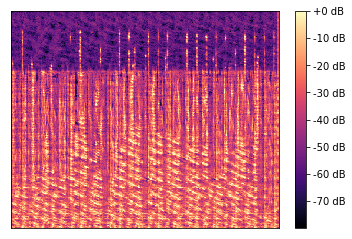

In [69]:
hopRockDreamSpectro = hopRockDreamSpectro[0,0,:]
hopRockDreamPhase = hopRockDreamPhase[0,0,:]

backToSpectro = librosa.power_to_db(sUtils.unscaleSpectro(hopRockDreamSpectro, origSpectroSize, minAmp, maxAmp))
backToPhase = sUtils.unscalePhase(hopRockDreamPhase, origSpectroSize, -math.pi, math.pi)

plt.figure()
librosa.display.specshow(backToSpectro)
plt.colorbar(format='%+2.0f dB')
plt.show()


In [70]:
backToSpectro = librosa.core.db_to_power(backToSpectro)
backToPhase = sUtils.unscalePhase(hopRockDreamPhase, origSpectroSize, -math.pi, math.pi)
invStft = np.zeros(backToSpectro.shape, dtype=np.complex_)
for i in range(invStft.shape[0]):
    for j in range(invStft.shape[1]):
        invStft[i,j] = complex(backToSpectro[i,j]*math.cos(backToPhase[i,j]), backToSpectro[i,j]*math.sin(backToPhase[i,j]))
n = len(x)
y_hat = librosa.istft(invStft, length = n)
ipd.Audio(data=y_hat[start*sr:end*sr], rate=sr)

In [71]:
librosa.output.write_wav('dreamExampleControl.wav', y_hat, sr)